In [1]:
!pip install plotly
!pip install yellowbrick
!pip install ydata-profiling

     ---------------------------------------- 0.0/15.3 MB ? eta -:--:--
     ---------------------------------------- 0.2/15.3 MB 10.2 MB/s eta 0:00:02
      --------------------------------------- 0.2/15.3 MB 3.7 MB/s eta 0:00:05
      --------------------------------------- 0.3/15.3 MB 2.3 MB/s eta 0:00:07
      --------------------------------------- 0.4/15.3 MB 2.3 MB/s eta 0:00:07
     - -------------------------------------- 0.4/15.3 MB 2.1 MB/s eta 0:00:08
     - -------------------------------------- 0.5/15.3 MB 1.9 MB/s eta 0:00:08
     - -------------------------------------- 0.6/15.3 MB 1.8 MB/s eta 0:00:09
     - -------------------------------------- 0.6/15.3 MB 1.8 MB/s eta 0:00:09
     - -------------------------------------- 0.7/15.3 MB 1.7 MB/s eta 0:00:09
     - -------------------------------------- 0.7/15.3 MB 1.7 MB/s eta 0:00:09
     -- ------------------------------------- 0.8/15.3 MB 1.6 MB/s eta 0:00:09
     -- ------------------------------------- 0.8/15.3 MB 


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\Dell\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


  Using cached yellowbrick-1.5-py3-none-any.whl (282 kB)
     ---------------------------------------- 0.0/8.3 MB ? eta -:--:--
      --------------------------------------- 0.2/8.3 MB 3.5 MB/s eta 0:00:03
      --------------------------------------- 0.2/8.3 MB 3.5 MB/s eta 0:00:03
      --------------------------------------- 0.2/8.3 MB 3.5 MB/s eta 0:00:03
     - -------------------------------------- 0.4/8.3 MB 2.1 MB/s eta 0:00:04
     - -------------------------------------- 0.4/8.3 MB 1.7 MB/s eta 0:00:05
     -- ------------------------------------- 0.5/8.3 MB 1.7 MB/s eta 0:00:05
     -- ------------------------------------- 0.6/8.3 MB 1.7 MB/s eta 0:00:05
     -- ------------------------------------- 0.6/8.3 MB 1.7 MB/s eta 0:00:05
     --- ------------------------------------ 0.7/8.3 MB 1.6 MB/s eta 0:00:05
     --- ------------------------------------ 0.7/8.3 MB 1.6 MB/s eta 0:00:05
     --- ------------------------------------ 0.7/8.3 MB 1.3 MB/s eta 0:00:06
     --- -----


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\Dell\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\Dell\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV,ElasticNet,ElasticNetCV,LogisticRegression
from sklearn.metrics import accuracy_score
import plotly.express as px
import plotly.graph_objs as go
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

%matplotlib inline

import warnings 
warnings.filterwarnings('ignore')


# Data Quality Analysis

### Importing the Wine Quality Dataset


In [3]:
winequality = pd.read_csv('winequality.csv')

### I'm starting with eyeballing the wine quality dataframe to get a general/tentative idea of columns.

In [4]:
print(winequality.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality  Id  
0      9.4        5   0  
1      9.8        5   1  
2      9

### Now I'm using the info command to know the type of data: numerical, integer or character.
#### Getting familiar with the data type help in identifying the test/model to use. 

In [5]:
print(winequality.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB
None


### Using the Describe() Command to get a summary about the Wine Quality Dataset

In [6]:
print(winequality.describe())

       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1143.000000       1143.000000  1143.000000     1143.000000   
mean        8.311111          0.531339     0.268364        2.532152   
std         1.747595          0.179633     0.196686        1.355917   
min         4.600000          0.120000     0.000000        0.900000   
25%         7.100000          0.392500     0.090000        1.900000   
50%         7.900000          0.520000     0.250000        2.200000   
75%         9.100000          0.640000     0.420000        2.600000   
max        15.900000          1.580000     1.000000       15.500000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  1143.000000          1143.000000           1143.000000  1143.000000   
mean      0.086933            15.615486             45.914698     0.996730   
std       0.047267            10.250486             32.782130     0.001925   
min       0.012000             1.000000         

# DATA CLEANING

### Checking for Duplicate Values


In [7]:
duplicates = winequality[winequality.duplicated()]
print(duplicates)

Empty DataFrame
Columns: [fixed acidity, volatile acidity, citric acid, residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, density, pH, sulphates, alcohol, quality, Id]
Index: []


### Checking for any NA values present in any of the columns of the dataset

In [8]:
print(winequality.isna().sum())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
Id                      0
dtype: int64


### Checking for any missing or null values present in any of the columns of the dataset.

In [9]:
print(winequality.isnull().sum())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
Id                      0
dtype: int64


# Exploratory Data Analysis

## Firstly, I'm plotting the values of the 'quality' feature

<AxesSubplot: xlabel='quality', ylabel='count'>

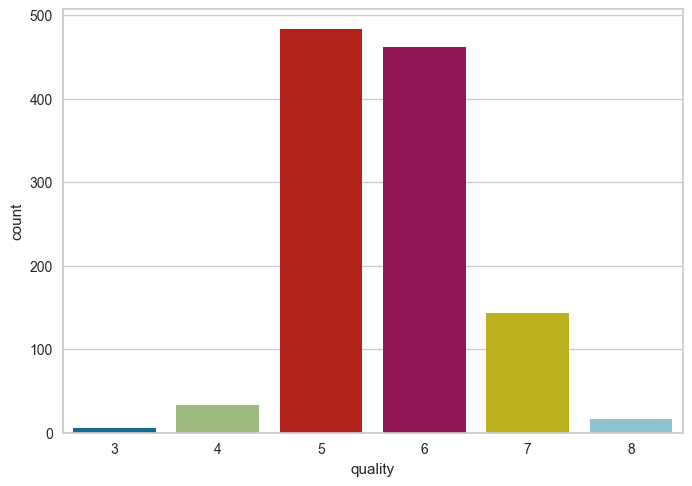

In [10]:
sns.countplot(data=winequality, x="quality")

The values of the 'quality' column are very unbalanced.
The values 5 and 6 are dominant, and the values 0, 1 and 2 are almost absent from the set.

## Let's plot some data columns to know how they are distributed in the dataset

### First, we will check the correlation between all the columns

In [11]:
corr=winequality.corr()
print(corr)

                      fixed acidity  volatile acidity  citric acid  \
fixed acidity              1.000000         -0.250728     0.673157   
volatile acidity          -0.250728          1.000000    -0.544187   
citric acid                0.673157         -0.544187     1.000000   
residual sugar             0.171831         -0.005751     0.175815   
chlorides                  0.107889          0.056336     0.245312   
free sulfur dioxide       -0.164831         -0.001962    -0.057589   
total sulfur dioxide      -0.110628          0.077748     0.036871   
density                    0.681501          0.016512     0.375243   
pH                        -0.685163          0.221492    -0.546339   
sulphates                  0.174592         -0.276079     0.331232   
alcohol                   -0.075055         -0.203909     0.106250   
quality                    0.121970         -0.407394     0.240821   
Id                        -0.275826         -0.007892    -0.139011   

                   

### For better understanding, I will create a heatmap

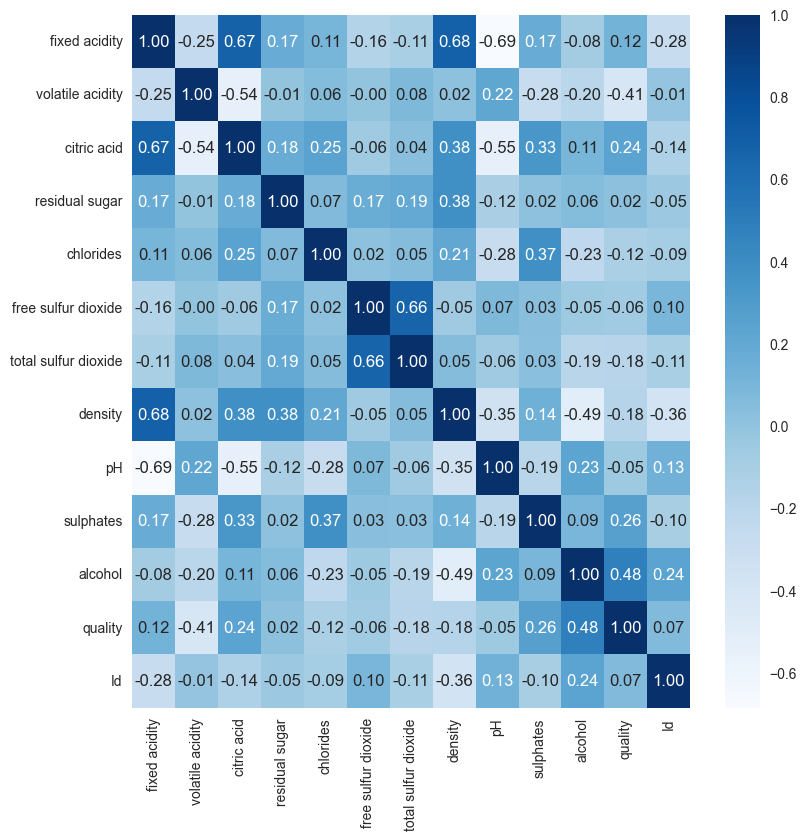

In [12]:
plt.figure(figsize=(9,9))
sns.heatmap(winequality.corr(),annot=True,fmt='0.2f',cmap='Blues')
plt.show()

## For even better understanding about how all the columns are correlated with our target variable "quality". I will use a Correlation bar.

## Distribution of correlations in relation to `quality`

In [13]:
winequality_corr_bar = winequality.corr().quality.sort_values()[:-1]
fig = px.bar(winequality_corr_bar, orientation="h", color_discrete_sequence=["#722F37"])
fig.update_layout(showlegend=False)
fig.show()

## Here, we can see that.

#### Alcohol and Quality has the strongest correlation. (quality increases with increase in alcohol)
#### Volatile acidity decreases with an increase in quality.
#### pH, residual sugar has a low level of correlation with quality.

### Now, I will plot a lineplot between 'alcohol' and 'quality' to visualise the strongest correlation between them.

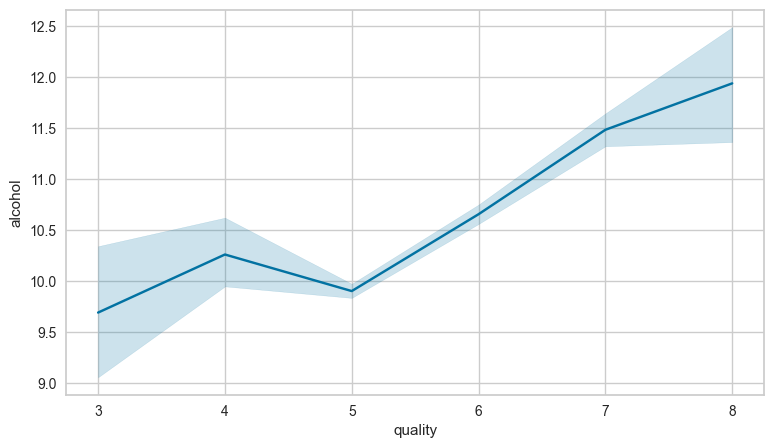

In [14]:
fig = plt.figure(figsize=(9, 5))
sns.lineplot(x='quality', y='alcohol', data=winequality)
plt.show()

## I will plot a Boxplot of the correlation between `quality`, and `volatile acidity`

In [15]:
fig = go.Figure()

for x in range(9):
    fig.add_trace(
        go.Box(
            x=winequality[winequality.quality == x]["volatile acidity"],
            y=winequality[winequality.quality == x].quality,
            name="Quality " + str(x),
        )
    )

fig.update_layout(yaxis_title="quality", xaxis_title="volatile acidity")
fig.update_traces(orientation="h")
fig.show()

###  Volatile acidity has a correlation value of -0.41
###  As the value of volatile acidity increases, the quality of wine increases.

## Now, I will plot a scatter plot of  'free sulphur dioxide' , 'total sulphur dioxide' with respect to 'quality'

In [16]:
fig = px.scatter(
    winequality,
    x="total sulfur dioxide",
    y="free sulfur dioxide",
    color=winequality.quality,
    color_continuous_scale="Blues",
)
fig.update_layout(legend_title_text="Quality")

### Here, we can see that as the total sulfur dioxide increases, the value of free sulfur dioxide increases.
### Also, we can see that, as the value of total sulfur dioxide and free sulfur dioxide decreases the quality of the wine increases.

## Now, I will plot a Boxplot of the correlation between `quality`, and `citric acid`

In [17]:
fig = go.Figure()

for x in range(9):
    fig.add_trace(
        go.Box(
            x=winequality[winequality.quality == x]["citric acid"],
            y=winequality[winequality.quality == x].quality,
            name="Quality " + str(x),
        )
    )

fig.update_layout(yaxis_title="quality", xaxis_title="citric acid")
fig.update_traces(orientation="h")
fig.show()

### I'm plotting a barplot as well for better understanding

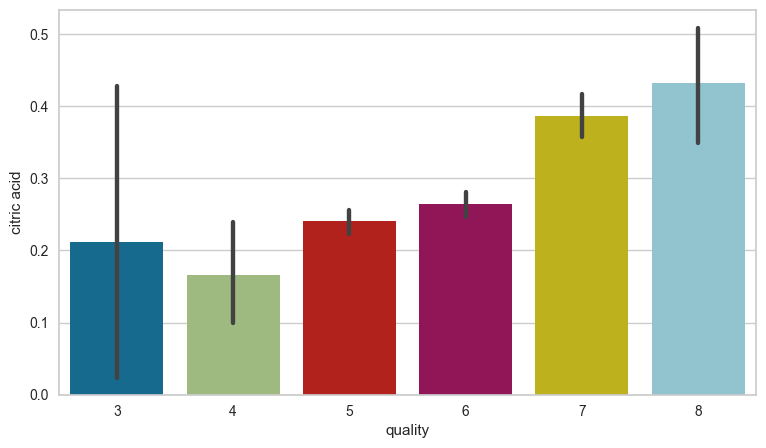

In [18]:
fig = plt.figure(figsize = (9,5))
sns.barplot(x = 'quality', y = 'citric acid', data = winequality)
plt.show()

### Here, we can see the composition of citric acid go higher as we go higher in the quality of the wine

### Now, I will plot a Boxplot of the correlation between `quality` and `sulphates`

In [19]:
fig = go.Figure()

for x in range(9):
    fig.add_trace(
        go.Box(
            x=winequality[winequality.quality == x].sulphates,
            y=winequality[winequality.quality == x].quality,
            name="Quality " + str(x),
        )
    )

fig.update_layout(yaxis_title="quality", xaxis_title="sulphates")
fig.update_traces(orientation="h")
fig.show()

## Here, we can see 

### Sulphates has a correlation value of 0.26
### As the value of sulphates increases the wine quality gets better.
### With quality equal to 5, a large number of outliers can be observed.

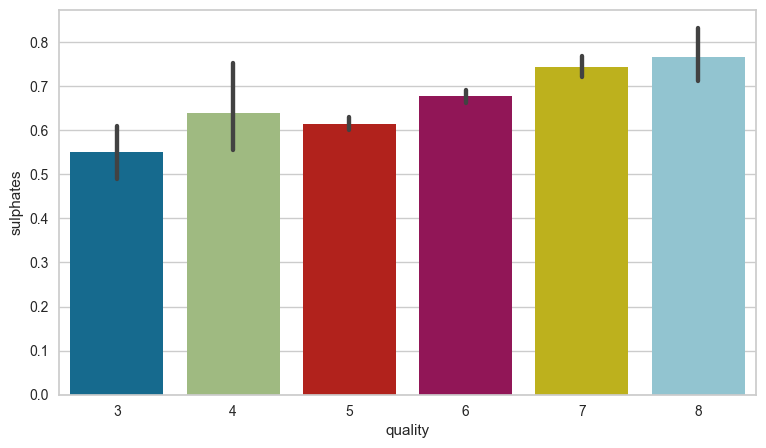

In [20]:
fig = plt.figure(figsize = (9,5))
sns.barplot(x = 'quality', y = 'sulphates', data = winequality)
plt.show()

### Now, I will plot a scatterplot between `citric acid`, `volatile acidity` with respect to 'quality'

In [21]:
fig = px.scatter(
    winequality,
    x="citric acid",
    y="volatile acidity",
    color=winequality.quality,
    color_continuous_scale="Blues",
)
fig.update_layout(legend_title_text="Quality")

#### Here, We can notice an inverted relationship between 'volatile acidity' and 'citric acid'.
#### As the value of 'citric acid' increases, the value of 'volatile acidity' decreases
#### A lower level of `volatile acidity' means better quality wine.

### Now, I will plot a barplot to examine the relationship between "chlorides" and "quality"

<AxesSubplot: xlabel='quality', ylabel='chlorides'>

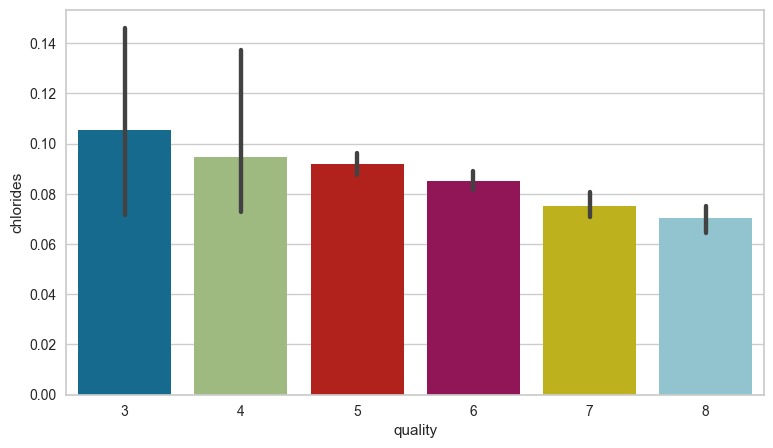

In [22]:
fig = plt.figure(figsize = (9,5))
sns.barplot(x = 'quality', y = 'chlorides', data = winequality)

Here, we can see that the composition of chloride decreases as we go higher in the quality of the wine

### Now, I will use the sort_values() command. The DataFrame winequality will be sorted in ascending order based on the values in the "quality" column.

In [23]:
winequality.sort_values(by=["quality"])

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
922,7.6,1.580,0.00,2.1,0.137,5.0,9.0,0.99476,3.50,0.40,10.9,3,1299
324,11.6,0.580,0.66,2.2,0.074,10.0,47.0,1.00080,3.25,0.57,9.0,3,459
1055,7.1,0.875,0.05,5.7,0.082,3.0,14.0,0.99808,3.40,0.52,10.2,3,1478
368,10.4,0.610,0.49,2.1,0.200,5.0,16.0,0.99940,3.16,0.63,8.4,3,517
1046,7.3,0.980,0.05,2.1,0.061,20.0,49.0,0.99705,3.31,0.55,9.7,3,1469
...,...,...,...,...,...,...,...,...,...,...,...,...,...
793,7.9,0.540,0.34,2.5,0.076,8.0,17.0,0.99235,3.20,0.72,13.1,8,1120
340,9.4,0.300,0.56,2.8,0.080,6.0,17.0,0.99640,3.15,0.92,11.7,8,481
321,11.3,0.620,0.67,5.2,0.086,6.0,19.0,0.99880,3.22,0.69,13.4,8,455
1030,7.2,0.380,0.31,2.0,0.056,15.0,29.0,0.99472,3.23,0.76,11.3,8,1449


<AxesSubplot: >

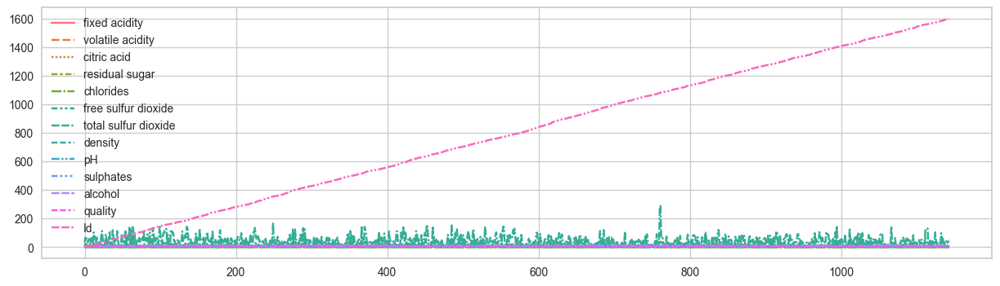

In [24]:
plt.figure(figsize=(15,4))
sns.lineplot(data=winequality)

This is line plot of the columns in winequality dataset with each column represented as a separate line.
The x-axis represents the index of the DataFrame, and the y-axis represents the values in each column.

## I'll use the ProfileReport from y-data Profiling to generate an entire report on the wine dataset

### ProfileReport from y-data profiling is a Python module for tasks involving data profiling. 
### The library offers tools to create profile reports for a given dataset that include statistical metrics,
### data kinds, metrics for data quality, and visualisations of data distribution.
 

In [25]:
ProfileReport(winequality)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Now, I'm using K-means Clustering technique.

K-means clustering is a popular unsupervised machine learning technique used for clustering or grouping data points into a 
specified number of clusters based on similarity or proximity

### It will help us identify patterns and relationships in wine quality data by grouping similar data points together into clusters.

I already Imported all the necessary libraries for this task.

Here, Quality column is not required so I'm dropping the quality column

In [ ]:
wine_noquality = winequality.drop('quality',axis=1)

In [ ]:
wine_noquality.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Id
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,2
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,4


## I'm implementing the "Elbow method" to find the optimal number of clusters for K-means clustering

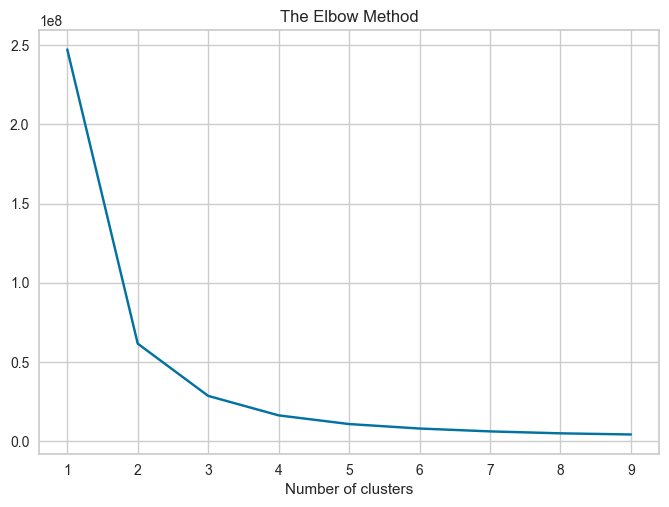

In [ ]:
wss =[]                #Defining an empty list named 'wss'


for i in range(1,10):  #I'm creating a loop through a range of 1 to 9, where 'i' is the number of clusters.
    kmeans = KMeans(n_clusters=i,init = 'k-means++',random_state=42) #The initialization method set to 'k-means++', and a random state of 42.
    kmeans.fit(wine_noquality) #I'm fitting the k-means model to the 'wine_noquality' dataset
    wss.append(kmeans.inertia_) #Append the within-cluster sum of squares (WSS) to the 'wss' list.

plt.plot(range(1,10),wss)  #I'm plotting the 'wss' values against the number of clusters.
plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.show()

#### I already imported the KelbowVisualizer library.
### we create a KMeans clustering model, and pass it as an argument to the KElbowVisualizer along with a range of k values we want to test. It helps to determine the optimal number of clusters for KMeans clustering.

## The optimal number of clusters can be determined by identifying the "elbow point" in the plot

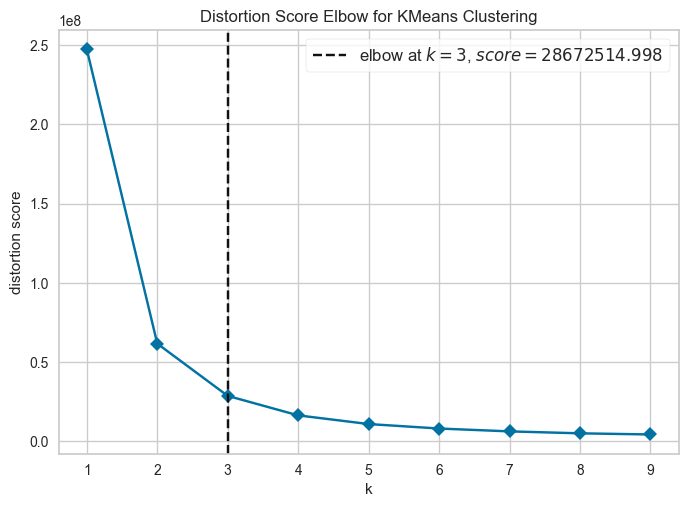

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
model = KMeans()
visualizer = KElbowVisualizer(model,k=(1,10),timings=False) #Initializes the visualizer
visualizer.fit(wine_noquality) #Fits the visualizer to the wine_noquality dataset.
visualizer.show()

## We can see the elbow point at 3, this gives us the optimalnumber of cluster i.e. 3

## Now, I will perform the Silhouette Analysis.

## Silhouette Analysis
### The silhouette score is a measure of how similar an object is to its own cluster compared to other clusters. The higher the silhouette score, the better the clustering performance.

In [ ]:
for i in range(2,10):
    kmeans = KMeans(n_clusters=i,max_iter=100)
    kmeans.fit(wine_noquality)
    score = silhouette_score(wine_noquality,kmeans.labels_)
    print(f"for cluster {i}: The Score is {score}")

for cluster 2: The Score is 0.6231749038279932
for cluster 3: The Score is 0.569916718212061
for cluster 4: The Score is 0.5483307601451468
for cluster 5: The Score is 0.5277312130325806
for cluster 6: The Score is 0.5113348655848713
for cluster 7: The Score is 0.49250794283592825
for cluster 8: The Score is 0.48011494958963896
for cluster 9: The Score is 0.46013625165812816


## We can see all the values are positive and The silhoutte score for 3 is 0.5697 which is ideal.

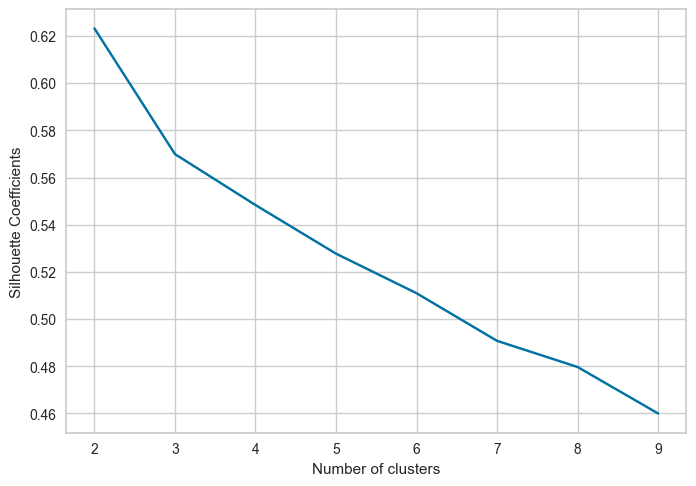

In [ ]:
silhouette_coefficients = []
for i in range(2,10):
    kmeans = KMeans(n_clusters=i,max_iter=100)
    kmeans.fit(wine_noquality)
    score = silhouette_score(wine_noquality,kmeans.labels_)
    silhouette_coefficients.append(score)

plt.plot(range(2,10),silhouette_coefficients) #I'm plotting a lineplot to visualize the Silhouette coefficients against the number of clusters
plt.xticks(range(2,10))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Coefficients")
plt.show()

# Principal Component Analysis

## Now, I will perform principal component analysis on the dataset and then fit the PCA model to the dataset.

## Now, I'm fitting the PCA model to the dataset and apply the transformation to the dataset. The transformed dataset is stored in a new variable winePCA.

### The transformed dataset winePCA represent the principal components as new columns which is obtained by multiplying it with the selected eigenvectors.

In [ ]:
pca = PCA()
winePCA = pca.fit_transform(wine_noquality)

In [ ]:
display(winePCA)

array([[ 8.04862036e+02, -1.82419563e+01,  1.09658876e+00, ...,
         2.47165756e-02,  8.07955964e-03,  1.86044768e-04],
       [ 8.04084548e+02,  1.70223563e+01,  7.55093908e+00, ...,
        -1.32216251e-01, -1.53243111e-02,  1.83245655e-04],
       [ 8.03006422e+02,  2.15892794e+00,  6.26448324e-01, ...,
        -1.07720463e-01, -5.26076774e-03,  2.89623359e-04],
       ...,
       [-7.89056686e+02,  7.22409646e+00,  1.34854620e+01, ...,
         2.00794749e-02,  1.03989484e-02, -2.18529160e-05],
       [-7.90018649e+02,  1.55896886e+01,  1.87959743e+01, ...,
         3.54115004e-02, -2.44982595e-02,  5.68190817e-04],
       [-7.92056733e+02,  7.24886655e+00,  1.34756007e+01, ...,
         1.40490376e-01, -2.28862686e-02, -2.49842701e-04]])

## Now, I'm applying the KMeans algorithm on the transformed data obtained after applying PCA to the original dataset.

In [ ]:
kmeans = KMeans(n_clusters = 3) #applying k-means with number of cluster =3
label = kmeans.fit_predict(winePCA)
unique_labels = np.unique(label) #To obtain the unique cluster labels.

## Now, I'll plot a scatter plot of the wine groups which are based on the results of the KMeans clustering algorithm.

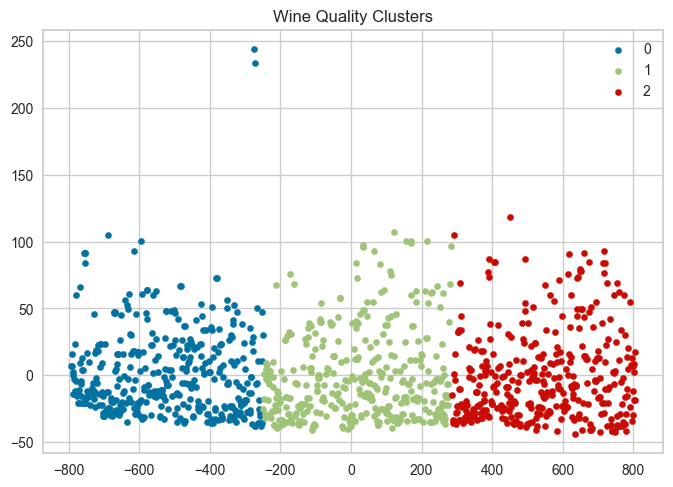

In [ ]:

for i in unique_labels:
#The variable unique_labels contains an array of unique labels assigned to each data point by the KMeans algorithm
    plt.scatter(winePCA[label==i,0],winePCA[label==i,1],label=i,s=20)
    
plt.legend()
plt.title("Wine Quality Clusters")
plt.show()

# Now, I will prepare the data for training a binary classification model that predicts whether a wine is of good or poor quality based on its chemical properties.

## I will prepare a new dataframe 'X' by dropping the following two columns Quality and ID.


In [ ]:
X=winequality.drop(['Id','quality'],axis=1)

In [ ]:
display(X)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2


## Now, I will create a new panda series 'Y' by applying a lambda function to the 'quality' column of the 'winequality' dataframe.
## The lambda function will check if the quality value is greater than or equal to 6.
### If the value is greater than or equal to 6 , the lambda function will return 1, i.e the wine is of good quality.
### If the value is less than 6, the lambda function will returns 0, i.e the wine is of bad quality.

In [ ]:
Y=winequality['quality'].apply(lambda y_values:1 if y_values>=6 else 0)

In [ ]:
display(Y)

0       0
1       0
2       0
3       1
4       0
       ..
1138    1
1139    1
1140    0
1141    1
1142    0
Name: quality, Length: 1143, dtype: int64

## Now, I will split the dataframe into random train and test dataframes.

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,random_state=2,test_size=0.2)

### In the above code,
### X represents the input features Dataframe
### Y represents the binary labels series
### Random state is set to 2 - This will set the random seed, which will ensure that everytime the data is split ,its split in the sameway when the code is run. 
### Test size is set to 0.2 - This will split the data into 80% and 20%. 20% of the data will be used for testing the model and 80% will be used for training the model.

In [ ]:
print(X_train,X_test,Y_train,Y_test)

      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
1130            7.4             0.350         0.33             2.4      0.068   
453             9.5             0.885         0.27             2.3      0.084   
1072            6.2             0.440         0.39             2.5      0.077   
877             6.5             0.670         0.00             4.3      0.057   
193             7.9             0.545         0.06             4.0      0.087   
...             ...               ...          ...             ...        ...   
1099            6.2             0.520         0.08             4.4      0.071   
466            10.7             0.430         0.39             2.2      0.106   
299             9.5             0.780         0.22             1.9      0.077   
493             5.1             0.470         0.02             1.3      0.034   
527             9.0             0.690         0.00             2.4      0.088   

      free sulfur dioxide  

# Now, Lets start training the model.
## I'm using the Supervised machine learning Technique "Random Forest" for training.

In [ ]:
Wine_Quality_Predictor=RandomForestClassifier()
Wine_Quality_Predictor.fit(X_train,Y_train)

RandomForestClassifier()

In the First line of the code, I'm creating a new Random forest classifier. 
And assigning it to the variable "Wine_Quality_predictor" which is my model.
In the second line of the code, I'm training the model on the train data.
By calling the fit() method, I'm training the randomforestmodel on the train data, 
so that it can learn the relationship between the input data and binary labels to make predictions on new unseen data

In [ ]:
X_test_prediction=Wine_Quality_Predictor.predict(X_test) 


The above code will make the predictions on the test data using the trained random forest model i.e 'Wine_Quality_Predictor'.
The predict() method takes the input X_test as test input and returns the predicted binary labels as output.

In [ ]:
test_data_accuracy = accuracy_score(X_test_prediction,Y_test)

The above code will compute the accuracy of the random forest model on the test data.
The accuracy_score() function will take two arguments:

X_test_prediction - The predicted binary labels for the test data which will be predicted in the code will executed earlier.     
Y_test - The actual binary labels for the test data which where generated when we split the data into train and test datasets.

In [ ]:
print("Accuracy:",test_data_accuracy)

Accuracy: 0.7379912663755459


In [ ]:
# Compute precision
precision = precision_score(X_test_prediction, Y_test, average='weighted')

# Compute recall
recall = recall_score(X_test_prediction, Y_test, average='weighted')

# Compute F1 score
f1 = f1_score(X_test_prediction, Y_test, average='weighted')

# Print the computed metrics
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Precision: 0.7378030359359372
Recall: 0.7379912663755459
F1 Score: 0.7378407327841421


### Now, I will scale the data for better accuracy. Scaling ensures that all the features in your dataset have similar ranges and prevents some features from dominating others during the model training process.

## Scaling using StandardScaler()

In [ ]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Now, I will train the random forest classifier on the scaled data

In [ ]:
Winequality_predictor2 = RandomForestClassifier()
Winequality_predictor2.fit(X_train_scaled, Y_train)

RandomForestClassifier()

In [ ]:
X_test_prediction1 = Winequality_predictor2.predict(X_test_scaled)

In [ ]:
accuracy1 = accuracy_score(X_test_prediction1,Y_test)
print("Accuracy1:", accuracy1)

Accuracy1: 0.777292576419214


In [ ]:
#c Compute precision
precision1 = precision_score(X_test_prediction1, Y_test, average='weighted')

# Compute recall
recall1 = recall_score(X_test_prediction1, Y_test, average='weighted')

# Compute F1 score
f1_score = f1_score(X_test_prediction1, Y_test, average='weighted')

# Print the computed metrics
print("Precision1:", precision)
print("Recall1:", recall)
print("F1 Score1:", f1)

Precision1: 0.7378030359359372
Recall1: 0.7379912663755459
F1 Score1: 0.7378407327841421
